In [1]:
import cv2
import numpy as np
import gym
from collections import deque
from tensorflow.keras.models import Sequential, clone_model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Input
from tensorflow.keras.optimizers import Adam
import keras.backend as K
import tensorflow as tf
import random
import matplotlib.pyplot as plt
import time

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import matplotlib.animation as animation
mpl.rc('animation', html='jshtml')

C:\Users\Peridot\.conda\envs\tf_cpu\lib\site-packages\gym\envs\registration.py:424: UserWarning: WARN: Custom namespace `ALE` is being overridden by namespace `ALE`. If you are developing a plugin you shouldn't specify a namespace in `register` calls. The namespace is specified through the entry point package metadata.
  f"Custom namespace `{spec.namespace}` is being overridden "


In [2]:
class DQNSolver:

    def __init__(self, observation_space, action_space):     
        self.epsilon = 1
        self.epsilon_decay = .9/1000
        self.epsilon_min = .05

        self.gamma = 0.95
        self.learn_rate = 0.001
        self.batch_size = 32
        
        self.action_space = action_space
        self.memory = deque(maxlen=1000000)
        self.min_memory_size = self.batch_size

        self.model = Sequential()
        self.model.add(Dense(24, input_shape=(observation_space,), activation="relu"))
        self.model.add(Dense(48, activation="relu"))
        self.model.add(Dense(self.action_space, activation="linear"))
        self.model.compile(loss="mse", optimizer=Adam(learning_rate = self.learn_rate))
        
        self.model_target = clone_model(self.model)
        
        self.learns = 0

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def act(self, state):
        if np.random.rand() < self.epsilon:
            return random.randrange(self.action_space)
        q_values = self.model.predict(state)
        return np.argmax(q_values[0])
    
    def experience_replay(self):
        if len(self.memory) < self.min_memory_size:
            return
        
        states = []
        next_states = []
        actions_taken = []
        rewards = []
        terminals = []
        while len(states) < self.batch_size:
            index = np.random.randint(4,len(self.memory) - 1)
            state, action, reward, next_state, terminal = self.memory[index]
            states.append(state)
            next_states.append(next_state)
            actions_taken.append(action)
            rewards.append(reward)
            terminals.append(terminal)
                
        states = np.squeeze(states)
        next_states = np.squeeze(next_states)
        
        labels = self.model.predict(np.array(states))
        next_state_values = self.model.predict(np.array(next_states))
        
        for i in range(self.batch_size):
            action = actions_taken[i]
            labels[i][action] = rewards[i] + (not terminals[i]) * self.gamma * max(next_state_values[i])

        """Train our model using the states and outputs generated"""
        self.model.fit(np.array(states),labels,batch_size = self.batch_size, epochs = 1, verbose = 1)

        """Decrease epsilon and update how many times our agent has learned"""
        if self.epsilon > self.epsilon_min:
            self.epsilon -= self.epsilon_decay
        self.learns += 1
        
        """Every 100 learned, copy our model weights to our target model"""
        if self.learns % 100 == 0:
            self.model_target.set_weights(self.model.get_weights())
            print('\nTarget model updated')

In [3]:
def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,

def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim

In [4]:
env = gym.make('MountainCar-v0')
#score_logger = ScoreLogger(ENV_NAME)
observation_space = env.observation_space.shape[0]
action_space = env.action_space.n
dqn_solver = DQNSolver(observation_space, action_space)
run = 0
all_rewards = []
while run<=400:
    run += 1
    state = env.reset()
    state = np.reshape(state, [1, observation_space])
    step = 0
    frames = []
    while True:
        step += 1
        frames.append(env.render(mode='rgb_array'))
        action = dqn_solver.act(state)
        state_next, reward, terminal, info = env.step(action)
        
        reward = -0.1 # Deoarece DQN are nevoie de rewarduri intermediare trebuie sa modificam putin rewardul
        if state_next[0]>=-0.5:
            reward = state_next[0] + 0.3 
        if state_next[0]>=0.5:
            reward = 10
            
        state_next = np.reshape(state_next, [1, observation_space])
        dqn_solver.remember(state, action, reward, state_next, terminal)
        state = state_next
        if terminal:
            print ("Run: " + str(run) + ", exploration: " + str(dqn_solver.epsilon) + ", score: " + str(-step))
            all_rewards.append(-step)
            #score_logger.add_score(step, run)
            break
        dqn_solver.experience_replay()

    if run%10==0:
        anim = plot_animation(frames)
        anim.save("Mountain_car{}.gif".format(run), dpi=100, writer= animation.PillowWriter(fps=20))# Saving the gif

1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 7.5710e-04

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 3.3490e-04
Run: 1, exploration: 0.848799999999998, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 6.6391e-04

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 4.9365e-04


1/1 [==============================] - 0s 3ms/step - loss: 6.9609e-04

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 3.8732e-04


1/1 [==============================] - 0s 3ms/step - loss: 6.0998e-04


1/1 [==============================] - 0s 4ms/step - loss: 5.5636e-04
Run: 2, exploration: 0.6696999999999956, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 6.1206e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 5ms/step - loss: 4.2715e-04


1/1 [==============================] - 0s 3ms/step - loss: 0.0375

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 5.2047e-04
Run: 3, exploration: 0.49059999999999326, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0336

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 7.6931e-04

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 4.2147e-04
Run: 4, exploration: 0.3114999999999909, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 5.0698e-04

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 3.2339e-04


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 5.6732e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 5, exploration: 0.13239999999998853, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 5.5857e-04


1/1 [==============================] - 0s 3ms/step - loss: 8.3276e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 5.8646e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0011


1/1 [==============================] - 0s 14ms/step
Run: 6, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 6.1126e-04


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0359


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 7.4231e-04

Target model updated
1/1 [==============================] - 0s 17ms/step
Run: 7, exploration: 0.0495999999999886, score: -139
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0075


1/1 [==============================] - 0s 3ms/step - loss: 0.0109

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021


1/1 [==============================] - 0s 3ms/step - loss: 0.5720

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 8, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0104


1/1 [==============================] - 0s 4ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step
Run: 9, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0035

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0010


1/1 [==============================] - 0s 3ms/step - loss: 0.0070

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0043


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step
Run: 10, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0193

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0051

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 11, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 2ms/step - loss: 0.3083

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0630


1/1 [==============================] - 0s 3ms/step - loss: 0.0077

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 12, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0301

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.3984


1/1 [==============================] - 0s 5ms/step - loss: 0.0355

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 13, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0046

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0013


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 13ms/step
Run: 14, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0028

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0061

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0075


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 15, exploration: 0.0495999999999886, score: -192


1/1 [==============================] - 0s 3ms/step - loss: 0.0042

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014


1/1 [==============================] - 0s 3ms/step - loss: 0.0140


1/1 [==============================] - 0s 3ms/step - loss: 0.0354

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 16, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0052

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0032


1/1 [==============================] - 0s 4ms/step - loss: 0.0067

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0089


1/1 [==============================] - 0s 14ms/step
Run: 17, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0049

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0497

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0031


1/1 [==============================] - 0s 16ms/step
Run: 18, exploration: 0.0495999999999886, score: -123
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0157


1/1 [==============================] - 0s 3ms/step - loss: 0.0026

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
Run: 19, exploration: 0.0495999999999886, score: -195
1/1 [==============================] - 0s 4ms/step - loss: 0.0054

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0028


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0049

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0154


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0023
Run: 20, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0045


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0033


1/1 [==============================] - 0s 2ms/step - loss: 0.0095

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 21, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0042

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 22, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0104


1/1 [==============================] - 0s 2ms/step - loss: 0.0063


1/1 [==============================] - 0s 3ms/step - loss: 0.0025


1/1 [==============================] - 0s 5ms/step - loss: 0.7928

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0019


1/1 [==============================] - 0s 15ms/step
Run: 23, exploration: 0.0495999999999886, score: -151
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 24, exploration: 0.0495999999999886, score: -86
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0012


1/1 [==============================] - 0s 3ms/step - loss: 0.0047

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0033


1/1 [==============================] - 0s 14ms/step
Run: 25, exploration: 0.0495999999999886, score: -150
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0016


1/1 [==============================] - 0s 4ms/step - loss: 0.0115


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0882

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0025
Run: 26, exploration: 0.0495999999999886, score: -139
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0074

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 27, exploration: 0.0495999999999886, score: -158
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0038

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0038


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0045

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 28, exploration: 0.0495999999999886, score: -153
1/1 [==============================] - 0s 3ms/step - loss: 0.0010


1/1 [==============================] - 0s 3ms/step - loss: 0.0013


1/1 [==============================] - 0s 4ms/step - loss: 0.0436

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step
Run: 29, exploration: 0.0495999999999886, score: -131
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0074

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 30, exploration: 0.0495999999999886, score: -134
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0035


1/1 [==============================] - 0s 4ms/step - loss: 0.0052


1/1 [==============================] - 0s 14ms/step
Run: 31, exploration: 0.0495999999999886, score: -191
1/1 [==============================] - 0s 3ms/step - loss: 0.0029

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0049

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
Run: 32, exploration: 0.0495999999999886, score: -151
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 13ms/step
Run: 33, exploration: 0.0495999999999886, score: -139
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 18ms/step
Run: 34, exploration: 0.0495999999999886, score: -123
1/1 [==============================] - 0s 5ms/step - loss: 0.0225

Target model updated
1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0072


1/1 [==============================] - 0s 5ms/step - loss: 0.0057

Target model updated
1/1 [==============================] - 0s 23ms/step
Run: 35, exploration: 0.0495999999999886, score: -120
1/1 [==============================] - 0s 4ms/step - loss: 0.0023


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 6ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 20ms/step
Run: 36, exploration: 0.0495999999999886, score: -95
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 4ms/step - loss: 7.1706e-04


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0058

Target model updated
1/1 [==============================] - 0s 5ms/step - loss: 0.0032


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step
Run: 37, exploration: 0.0495999999999886, score: -165
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0031

Target model updated
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 23ms/step
Run: 38, exploration: 0.0495999999999886, score: -113
1/1 [==============================] - 0s 5ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 22ms/step
Run: 39, exploration: 0.0495999999999886, score: -121
1/1 [==============================] - 0s 4ms/step - loss: 0.0078

Target model updated
1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.1800

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 23ms/step
Run: 40, exploration: 0.0495999999999886, score: -139
1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0029


1/1 [==============================] - 0s 25ms/step
Run: 41, exploration: 0.0495999999999886, score: -114
1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 8ms/step - loss: 0.0224

Target model updated
1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 25ms/step
Run: 42, exploration: 0.0495999999999886, score: -144
1/1 [==============================] - 0s 6ms/step - loss: 0.0055

Target model updated
1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0041


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0028

Target model updated
1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 26ms/step
Run: 43, exploration: 0.0495999999999886, score: -166
1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0031

Target model updated
1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 23ms/step
Run: 44, exploration: 0.0495999999999886, score: -118
1/1 [==============================] - 0s 3ms/step - loss: 0.0102


1/1 [==============================] - 0s 5ms/step - loss: 0.0047

Target model updated
1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0040

Target model updated
1/1 [==============================] - 0s 22ms/step
Run: 45, exploration: 0.0495999999999886, score: -142
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 7ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 34ms/step
Run: 46, exploration: 0.0495999999999886, score: -124
1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0032


1/1 [==============================] - 0s 6ms/step - loss: 6.2567e-04

Target model updated
1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 7ms/step - loss: 0.0058


1/1 [==============================] - 0s 26ms/step
Run: 47, exploration: 0.0495999999999886, score: -122
1/1 [==============================] - 0s 7ms/step - loss: 0.0057


1/1 [==============================] - 0s 7ms/step - loss: 0.8468

Target model updated
1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0078

Target model updated
1/1 [==============================] - 0s 5ms/step - loss: 6.8893e-04


1/1 [==============================] - 0s 27ms/step
Run: 48, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 5ms/step - loss: 0.0016


1/1 [==============================] - 0s 5ms/step - loss: 0.0062

Target model updated
1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0072


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step
Run: 49, exploration: 0.0495999999999886, score: -126
1/1 [==============================] - 0s 5ms/step - loss: 0.1966

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.1255


1/1 [==============================] - 0s 4ms/step - loss: 0.0596


1/1 [==============================] - 0s 3ms/step - loss: 7.2314e-04

Target model updated
1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step
Run: 50, exploration: 0.0495999999999886, score: -174
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 24ms/step
Run: 51, exploration: 0.0495999999999886, score: -130
1/1 [==============================] - 0s 5ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0206

Target model updated
1/1 [==============================] - 0s 16ms/step
Run: 52, exploration: 0.0495999999999886, score: -126
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 22ms/step
Run: 53, exploration: 0.0495999999999886, score: -125


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0043

Target model updated
1/1 [==============================] - 0s 5ms/step - loss: 0.0127


1/1 [==============================] - 0s 4ms/step - loss: 0.1472


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0043

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 20ms/step
Run: 54, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0232

Target model updated
1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0063


1/1 [==============================] - 0s 5ms/step - loss: 7.4434e-04

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 24ms/step
Run: 55, exploration: 0.0495999999999886, score: -192
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0079

Target model updated
1/1 [==============================] - 0s 5ms/step - loss: 0.0058


1/1 [==============================] - 0s 19ms/step
Run: 56, exploration: 0.0495999999999886, score: -125
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 4ms/step - loss: 7.7941e-04


1/1 [==============================] - 0s 3ms/step - loss: 7.1296e-04

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0326


1/1 [==============================] - 0s 16ms/step
Run: 57, exploration: 0.0495999999999886, score: -132
1/1 [==============================] - 0s 2ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0429

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0055


1/1 [==============================] - 0s 14ms/step
Run: 58, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0094

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0032


1/1 [==============================] - 0s 4ms/step - loss: 0.0018


1/1 [==============================] - 0s 3ms/step - loss: 0.0063

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 59, exploration: 0.0495999999999886, score: -128
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0047

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 13ms/step
Run: 60, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 7.0507e-04


1/1 [==============================] - 0s 16ms/step
Run: 61, exploration: 0.0495999999999886, score: -151
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0116

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
Run: 62, exploration: 0.0495999999999886, score: -128


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0187

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 63, exploration: 0.0495999999999886, score: -122
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0029


1/1 [==============================] - 0s 4ms/step - loss: 0.0102

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 15ms/step
Run: 64, exploration: 0.0495999999999886, score: -122
1/1 [==============================] - 0s 4ms/step - loss: 0.0011


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
Run: 65, exploration: 0.0495999999999886, score: -155
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0163

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0096

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 66, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0146

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0047


1/1 [==============================] - 0s 14ms/step
Run: 67, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0397

Target model updated
1/1 [==============================] - 0s 2ms/step - loss: 0.0011


1/1 [==============================] - 0s 2ms/step - loss: 0.0010


1/1 [==============================] - 0s 13ms/step
Run: 68, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0057

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0035


1/1 [==============================] - 0s 2ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 16ms/step
Run: 69, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0054


1/1 [==============================] - 0s 14ms/step
Run: 70, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0029

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0060


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 13ms/step
Run: 71, exploration: 0.0495999999999886, score: -169
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0121


1/1 [==============================] - 0s 3ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 4.6685e-04


1/1 [==============================] - 0s 2ms/step - loss: 0.0096

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 72, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0067

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 73, exploration: 0.0495999999999886, score: -126


1/1 [==============================] - 0s 3ms/step - loss: 0.0011


1/1 [==============================] - 0s 3ms/step - loss: 5.3836e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0034


1/1 [==============================] - 0s 13ms/step
Run: 74, exploration: 0.0495999999999886, score: -123
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0048

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0048

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 17ms/step
Run: 75, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0064


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.1716

Target model updated
1/1 [==============================] - 0s 13ms/step
Run: 76, exploration: 0.0495999999999886, score: -154
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 2ms/step - loss: 0.0044


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0036

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 77, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.2108


1/1 [==============================] - 0s 3ms/step - loss: 0.0324


1/1 [==============================] - 0s 13ms/step
Run: 78, exploration: 0.0495999999999886, score: -159
1/1 [==============================] - 0s 4ms/step - loss: 0.1466


1/1 [==============================] - 0s 3ms/step - loss: 0.0055

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0944


1/1 [==============================] - 0s 3ms/step - loss: 0.0074

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step
Run: 79, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0482


1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 2ms/step - loss: 9.8898e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
Run: 80, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0023


1/1 [==============================] - 0s 2ms/step - loss: 0.1559

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0049


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0079

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 81, exploration: 0.0495999999999886, score: -166
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0210

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0056


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 82, exploration: 0.0495999999999886, score: -178
1/1 [==============================] - 0s 2ms/step - loss: 0.1210


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 6.4312e-04

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 83, exploration: 0.0495999999999886, score: -166
1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 2ms/step - loss: 0.0922

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0030


1/1 [==============================] - 0s 3ms/step - loss: 0.0057

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 7.4768e-04


1/1 [==============================] - 0s 13ms/step
Run: 84, exploration: 0.0495999999999886, score: -161
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0189

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 6.8518e-04
Run: 85, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 3ms/step - loss: 0.0108

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 13ms/step
Run: 86, exploration: 0.0495999999999886, score: -127
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0904


1/1 [==============================] - 0s 3ms/step - loss: 0.0033

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0041


1/1 [==============================] - 0s 15ms/step
Run: 87, exploration: 0.0495999999999886, score: -148
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0016


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0018
Run: 88, exploration: 0.0495999999999886, score: -153
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0270

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0408


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 89, exploration: 0.0495999999999886, score: -169
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0036

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 90, exploration: 0.0495999999999886, score: -142
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0056

Target model updated
1/1 [==============================] - 0s 13ms/step
Run: 91, exploration: 0.0495999999999886, score: -189
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 1.3902


1/1 [==============================] - 0s 3ms/step - loss: 0.0971

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0119


1/1 [==============================] - 0s 14ms/step
Run: 92, exploration: 0.0495999999999886, score: -154
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0172

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0162


1/1 [==============================] - 0s 3ms/step - loss: 0.0094


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 93, exploration: 0.0495999999999886, score: -149
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 9.0277e-04

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 94, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0608

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0047

Target model updated
1/1 [==============================] - 0s 16ms/step
Run: 95, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0018


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0038


1/1 [==============================] - 0s 14ms/step
Run: 96, exploration: 0.0495999999999886, score: -163
1/1 [==============================] - 0s 3ms/step - loss: 0.0027


1/1 [==============================] - 0s 4ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0016


1/1 [==============================] - 0s 2ms/step - loss: 0.0030


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 97, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0018


1/1 [==============================] - 0s 3ms/step - loss: 0.0034


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 98, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.5443


1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0285


1/1 [==============================] - 0s 13ms/step
Run: 99, exploration: 0.0495999999999886, score: -124
1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0030


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0775

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0040


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
Run: 100, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0144


1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 3ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step
Run: 101, exploration: 0.0495999999999886, score: -148
1/1 [==============================] - 0s 3ms/step - loss: 0.0040


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0035

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0069


1/1 [==============================] - 0s 3ms/step - loss: 9.0813e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 102, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0032


1/1 [==============================] - 0s 3ms/step - loss: 0.0045

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 15ms/step
Run: 103, exploration: 0.0495999999999886, score: -136
1/1 [==============================] - 0s 3ms/step - loss: 0.0129


1/1 [==============================] - 0s 4ms/step - loss: 0.0031

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0040


1/1 [==============================] - 0s 14ms/step
Run: 104, exploration: 0.0495999999999886, score: -187
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 105, exploration: 0.0495999999999886, score: -145
1/1 [==============================] - 0s 3ms/step - loss: 0.0047

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0036

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step
Run: 106, exploration: 0.0495999999999886, score: -129
1/1 [==============================] - 0s 3ms/step - loss: 0.0060


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0058

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0023


1/1 [==============================] - 0s 17ms/step
Run: 107, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 6.0084e-04


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 8.8713e-04

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0588

Target model updated
1/1 [==============================] - 0s 13ms/step
Run: 108, exploration: 0.0495999999999886, score: -200


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0080

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0012


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0129

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0233
Run: 109, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0059


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0033

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 110, exploration: 0.0495999999999886, score: -197
1/1 [==============================] - 0s 3ms/step - loss: 9.6861e-04


1/1 [==============================] - 0s 3ms/step - loss: 9.3960e-04


1/1 [==============================] - 0s 3ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0407


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step
Run: 111, exploration: 0.0495999999999886, score: -142
1/1 [==============================] - 0s 3ms/step - loss: 0.0369


1/1 [==============================] - 0s 2ms/step - loss: 0.0055

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0012


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 112, exploration: 0.0495999999999886, score: -161
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0027


1/1 [==============================] - 0s 13ms/step
Run: 113, exploration: 0.0495999999999886, score: -157


1/1 [==============================] - 0s 3ms/step - loss: 0.0045

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0045

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 114, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 2ms/step - loss: 0.0041


1/1 [==============================] - 0s 2ms/step - loss: 0.4784

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019


1/1 [==============================] - 0s 14ms/step
Run: 115, exploration: 0.0495999999999886, score: -124
1/1 [==============================] - 0s 4ms/step - loss: 0.0500

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013
Run: 116, exploration: 0.0495999999999886, score: -153
1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 3ms/step - loss: 0.0053


1/1 [==============================] - 0s 2ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 117, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0024


1/1 [==============================] - 0s 4ms/step - loss: 0.0589

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0061


1/1 [==============================] - 0s 13ms/step
Run: 118, exploration: 0.0495999999999886, score: -134
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.2937

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
Run: 119, exploration: 0.0495999999999886, score: -159
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 7.4966e-04

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0059


1/1 [==============================] - 0s 4ms/step - loss: 0.0055


1/1 [==============================] - 0s 3ms/step - loss: 0.0133

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 120, exploration: 0.0495999999999886, score: -184
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0584

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 121, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0041

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 19ms/step
Run: 122, exploration: 0.0495999999999886, score: -127
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0050

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.1190

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 123, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0049

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0017
Run: 124, exploration: 0.0495999999999886, score: -175
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated


1/1 [==============================] - 0s 4ms/step - loss: 5.8181e-04


1/1 [==============================] - 0s 4ms/step - loss: 0.0013


1/1 [==============================] - 0s 4ms/step - loss: 0.0069

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0011


1/1 [==============================] - 0s 3ms/step - loss: 0.0021
Run: 125, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 2ms/step - loss: 0.0060


1/1 [==============================] - 0s 14ms/step
Run: 126, exploration: 0.0495999999999886, score: -137
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0033


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018


1/1 [==============================] - 0s 4ms/step - loss: 0.0047

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 127, exploration: 0.0495999999999886, score: -152


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step
Run: 128, exploration: 0.0495999999999886, score: -153
1/1 [==============================] - 0s 3ms/step - loss: 0.0032


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018


1/1 [==============================] - 0s 4ms/step - loss: 0.0017
Run: 129, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0024


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0022


1/1 [==============================] - 0s 3ms/step - loss: 0.0421

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
Run: 130, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 12ms/step
Run: 131, exploration: 0.0495999999999886, score: -161
1/1 [==============================] - 0s 116ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0312

Target model updated
1/1 [==============================] - 0s 30ms/step
Run: 132, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 11ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 27ms/step
Run: 133, exploration: 0.0495999999999886, score: -191
1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 7ms/step - loss: 0.2268

Target model updated
1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 26ms/step
Run: 134, exploration: 0.0495999999999886, score: -162


1/1 [==============================] - 0s 17ms/step - loss: 0.0043

Target model updated
1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 7ms/step - loss: 0.2868

Target model updated
1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 22ms/step
Run: 135, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0038

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 15ms/step
Run: 136, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0026

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0250


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step
Run: 137, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0132


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 138, exploration: 0.0495999999999886, score: -158
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0494

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 139, exploration: 0.0495999999999886, score: -161
1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 3ms/step - loss: 1.1967

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0024


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 9.4069e-04

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
Run: 140, exploration: 0.0495999999999886, score: -155
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 141, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0395

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 8.1130e-04


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 142, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
Run: 143, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 9.2279e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 144, exploration: 0.0495999999999886, score: -160
1/1 [==============================] - 0s 3ms/step - loss: 0.8122

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 6.6930e-04


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0023


1/1 [==============================] - 0s 2ms/step - loss: 0.1811

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015
Run: 145, exploration: 0.0495999999999886, score: -175


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 146, exploration: 0.0495999999999886, score: -139
1/1 [==============================] - 0s 3ms/step - loss: 0.0047


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 147, exploration: 0.0495999999999886, score: -182
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0400

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0015


1/1 [==============================] - 0s 16ms/step
Run: 148, exploration: 0.0495999999999886, score: -132
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 149, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0048


1/1 [==============================] - 0s 3ms/step - loss: 0.0090


1/1 [==============================] - 0s 3ms/step - loss: 0.0480

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 150, exploration: 0.0495999999999886, score: -133
1/1 [==============================] - 0s 3ms/step - loss: 0.0027


1/1 [==============================] - 0s 3ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0144

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.1079


1/1 [==============================] - 0s 15ms/step
Run: 151, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 12ms/step
Run: 152, exploration: 0.0495999999999886, score: -146
1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0122


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 9.2112e-04


1/1 [==============================] - 0s 14ms/step
Run: 153, exploration: 0.0495999999999886, score: -159
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 8.5911e-04


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0030


1/1 [==============================] - 0s 13ms/step
Run: 154, exploration: 0.0495999999999886, score: -175
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
Run: 155, exploration: 0.0495999999999886, score: -152
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 8.8039e-04

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 1.1141

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 156, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0109

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 157, exploration: 0.0495999999999886, score: -125
1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0271


1/1 [==============================] - 0s 3ms/step - loss: 9.8523e-04

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0329


1/1 [==============================] - 0s 16ms/step
Run: 158, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 7.6287e-04


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 15ms/step
Run: 159, exploration: 0.0495999999999886, score: -139
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step
Run: 160, exploration: 0.0495999999999886, score: -149
1/1 [==============================] - 0s 4ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0232

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 161, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
Run: 162, exploration: 0.0495999999999886, score: -162
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0057

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0241

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 163, exploration: 0.0495999999999886, score: -164
1/1 [==============================] - 0s 2ms/step - loss: 0.0027


1/1 [==============================] - 0s 4ms/step - loss: 1.0916


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 164, exploration: 0.0495999999999886, score: -121
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0027


1/1 [==============================] - 0s 4ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0048


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0395

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 165, exploration: 0.0495999999999886, score: -199
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0134


1/1 [==============================] - 0s 14ms/step
Run: 166, exploration: 0.0495999999999886, score: -159
1/1 [==============================] - 0s 3ms/step - loss: 0.0209

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 6.8151e-04

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 167, exploration: 0.0495999999999886, score: -124
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 7.0678e-04

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 168, exploration: 0.0495999999999886, score: -144
1/1 [==============================] - 0s 2ms/step - loss: 0.0016


1/1 [==============================] - 0s 3ms/step - loss: 0.0047


1/1 [==============================] - 0s 4ms/step - loss: 0.0125

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0041

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 169, exploration: 0.0495999999999886, score: -175
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0327

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.2622


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 170, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0053


1/1 [==============================] - 0s 2ms/step - loss: 0.0038

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 171, exploration: 0.0495999999999886, score: -191
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0017
Run: 172, exploration: 0.0495999999999886, score: -122


1/1 [==============================] - 0s 3ms/step - loss: 0.0213


1/1 [==============================] - 0s 3ms/step - loss: 0.0064

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0029


1/1 [==============================] - 0s 3ms/step - loss: 0.0036


1/1 [==============================] - 0s 3ms/step - loss: 0.0032

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 173, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0018


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 13ms/step
Run: 174, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 2ms/step - loss: 8.3722e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021


1/1 [==============================] - 0s 14ms/step
Run: 175, exploration: 0.0495999999999886, score: -160
1/1 [==============================] - 0s 3ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 176, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0355

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step
Run: 177, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 4ms/step - loss: 0.0028


1/1 [==============================] - 0s 4ms/step - loss: 0.0012


1/1 [==============================] - 0s 5ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 5ms/step - loss: 0.0040


1/1 [==============================] - 0s 16ms/step
Run: 178, exploration: 0.0495999999999886, score: -166
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.9428


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
Run: 179, exploration: 0.0495999999999886, score: -162
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0023


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 20ms/step
Run: 180, exploration: 0.0495999999999886, score: -143
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0063

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0050
Run: 181, exploration: 0.0495999999999886, score: -178
1/1 [==============================] - 0s 5ms/step - loss: 0.0033

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0191

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step
Run: 182, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014


1/1 [==============================] - 0s 5ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016


1/1 [==============================] - 0s 4ms/step - loss: 0.0081


1/1 [==============================] - 0s 19ms/step
Run: 183, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0028

Target model updated
1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 10ms/step - loss: 0.0039

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step
Run: 184, exploration: 0.0495999999999886, score: -144
1/1 [==============================] - 0s 5ms/step - loss: 0.0080


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0033

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 17ms/step
Run: 185, exploration: 0.0495999999999886, score: -145
1/1 [==============================] - 0s 3ms/step - loss: 0.0025


1/1 [==============================] - 0s 5ms/step - loss: 0.0464

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0027

Target model updated


1/1 [==============================] - 0s 19ms/step
Run: 186, exploration: 0.0495999999999886, score: -153
1/1 [==============================] - 0s 8ms/step - loss: 0.0060


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 5ms/step - loss: 7.8982e-04

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0027


1/1 [==============================] - 0s 19ms/step
Run: 187, exploration: 0.0495999999999886, score: -151
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0049

Target model updated
1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 8.2969e-04

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 18ms/step
Run: 188, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step
Run: 189, exploration: 0.0495999999999886, score: -140
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0054

Target model updated
1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0040


1/1 [==============================] - 0s 6ms/step - loss: 7.5401e-04

Target model updated
1/1 [==============================] - 0s 6ms/step - loss: 0.0170


1/1 [==============================] - 0s 25ms/step
Run: 190, exploration: 0.0495999999999886, score: -186
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 8.2639e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 191, exploration: 0.0495999999999886, score: -137
1/1 [==============================] - 0s 4ms/step - loss: 0.0026


1/1 [==============================] - 0s 3ms/step - loss: 0.0021


1/1 [==============================] - 0s 4ms/step - loss: 4.7283e-04

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 22ms/step
Run: 192, exploration: 0.0495999999999886, score: -150
1/1 [==============================] - 0s 3ms/step - loss: 0.0023


1/1 [==============================] - 0s 5ms/step - loss: 0.0072

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 193, exploration: 0.0495999999999886, score: -182
1/1 [==============================] - 0s 3ms/step - loss: 0.0020


1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 194, exploration: 0.0495999999999886, score: -136
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0032

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step
Run: 195, exploration: 0.0495999999999886, score: -164
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0026

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 17ms/step
Run: 196, exploration: 0.0495999999999886, score: -169
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022



Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step
Run: 197, exploration: 0.0495999999999886, score: -193
1/1 [==============================] - 0s 3ms/step - loss: 0.0246


1/1 [==============================] - 0s 5ms/step - loss: 0.0025


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0069


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0028

Target model updated
1/1 [==============================] - 0s 18ms/step
Run: 198, exploration: 0.0495999999999886, score: -196
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0057


1/1 [==============================] - 0s 4ms/step - loss: 0.0322

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021


1/1 [==============================] - 0s 3ms/step - loss: 1.0122

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step
Run: 199, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0016


1/1 [==============================] - 0s 3ms/step - loss: 0.0039


1/1 [==============================] - 0s 3ms/step - loss: 0.0042

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016


1/1 [==============================] - 0s 19ms/step
Run: 200, exploration: 0.0495999999999886, score: -159
1/1 [==============================] - 0s 2ms/step - loss: 0.0029

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0015


1/1 [==============================] - 0s 6ms/step - loss: 0.0020


1/1 [==============================] - 0s 4ms/step - loss: 0.0071

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 201, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.1890


1/1 [==============================] - 0s 4ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0026


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0290

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 6ms/step - loss: 0.0305


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0023
Run: 202, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0290

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 20ms/step
Run: 203, exploration: 0.0495999999999886, score: -151
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0032

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 1.3741

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
Run: 204, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0055

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 18ms/step
Run: 205, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 3ms/step - loss: 0.0021


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0018


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 31ms/step
Run: 206, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 3ms/step - loss: 5.8856e-04

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 207, exploration: 0.0495999999999886, score: -165
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step
Run: 208, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0035


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0043


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step
Run: 209, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0070

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0559

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 16ms/step
Run: 210, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0029

Target model updated
1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 16ms/step
Run: 211, exploration: 0.0495999999999886, score: -171
1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0026


1/1 [==============================] - 0s 5ms/step - loss: 0.0055

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0016


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0063

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 212, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.6747


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step
Run: 213, exploration: 0.0495999999999886, score: -158
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0282


1/1 [==============================] - 0s 16ms/step
Run: 214, exploration: 0.0495999999999886, score: -195
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0042

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0074

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 18ms/step
Run: 215, exploration: 0.0495999999999886, score: -160
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 216, exploration: 0.0495999999999886, score: -173
1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0033

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.5513


1/1 [==============================] - 0s 16ms/step
Run: 217, exploration: 0.0495999999999886, score: -157
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0026

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0050


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0503

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 20ms/step
Run: 218, exploration: 0.0495999999999886, score: -192
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0011


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 17ms/step
Run: 219, exploration: 0.0495999999999886, score: -140
1/1 [==============================] - 0s 3ms/step - loss: 0.0246


1/1 [==============================] - 0s 3ms/step - loss: 0.4577

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014


1/1 [==============================] - 0s 3ms/step - loss: 0.0040


1/1 [==============================] - 0s 4ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 21ms/step
Run: 220, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 221, exploration: 0.0495999999999886, score: -162
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0026

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0040

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017
Run: 222, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 3ms/step - loss: 0.0046


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0474

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 223, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014


1/1 [==============================] - 0s 4ms/step - loss: 9.9774e-04

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 1.0975

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 224, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 16ms/step
Run: 225, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0243

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step
Run: 226, exploration: 0.0495999999999886, score: -181
1/1 [==============================] - 0s 3ms/step - loss: 9.3700e-04

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 6ms/step - loss: 0.0179

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 227, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0171

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012


1/1 [==============================] - 0s 4ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 23ms/step
Run: 228, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 229, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0018


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.9664

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0017


1/1 [==============================] - 0s 17ms/step
Run: 230, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0014


1/1 [==============================] - 0s 3ms/step - loss: 5.2236e-04

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.1172


1/1 [==============================] - 0s 15ms/step
Run: 231, exploration: 0.0495999999999886, score: -171
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0429

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0051

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0026


1/1 [==============================] - 0s 15ms/step
Run: 232, exploration: 0.0495999999999886, score: -186
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 233, exploration: 0.0495999999999886, score: -163
1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step
Run: 234, exploration: 0.0495999999999886, score: -200


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step
Run: 235, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0040


1/1 [==============================] - 0s 3ms/step - loss: 0.0420


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 236, exploration: 0.0495999999999886, score: -155
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0042

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 237, exploration: 0.0495999999999886, score: -183
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 238, exploration: 0.0495999999999886, score: -134
1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017


1/1 [==============================] - 0s 3ms/step - loss: 9.4422e-04

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 239, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0261


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0026

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 240, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0044


1/1 [==============================] - 0s 15ms/step
Run: 241, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
Run: 242, exploration: 0.0495999999999886, score: -157
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0035

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0017


1/1 [==============================] - 0s 3ms/step - loss: 0.0163

Target model updated
1/1 [==============================] - 0s 18ms/step
Run: 243, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 9.4762e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0011
Run: 244, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012


1/1 [==============================] - 0s 4ms/step - loss: 0.0213

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0016


1/1 [==============================] - 0s 17ms/step
Run: 245, exploration: 0.0495999999999886, score: -166
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.8697

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 246, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0182


1/1 [==============================] - 0s 5ms/step - loss: 0.0117

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step
Run: 247, exploration: 0.0495999999999886, score: -97
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0054

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0171

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 18ms/step
Run: 248, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0042

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0038

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0020


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 23ms/step
Run: 249, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0254

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 250, exploration: 0.0495999999999886, score: -169
1/1 [==============================] - 0s 4ms/step - loss: 9.3914e-04


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0036

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 18ms/step
Run: 251, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 17ms/step
Run: 252, exploration: 0.0495999999999886, score: -160
1/1 [==============================] - 0s 5ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0021


1/1 [==============================] - 0s 3ms/step - loss: 8.9939e-04


1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 253, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0041

Target model updated
1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0067

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 254, exploration: 0.0495999999999886, score: -147
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0023


1/1 [==============================] - 0s 15ms/step
Run: 255, exploration: 0.0495999999999886, score: -126
1/1 [==============================] - 0s 3ms/step - loss: 6.8124e-04

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 9.2223e-04


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0026

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 256, exploration: 0.0495999999999886, score: -155
1/1 [==============================] - 0s 4ms/step - loss: 0.0020


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
Run: 257, exploration: 0.0495999999999886, score: -166
1/1 [==============================] - 0s 3ms/step - loss: 0.0290

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0658


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step
Run: 258, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 2ms/step - loss: 0.0035


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0207

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 15ms/step
Run: 259, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0018


1/1 [==============================] - 0s 14ms/step
Run: 260, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.8868

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0082


1/1 [==============================] - 0s 3ms/step - loss: 0.0057

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 261, exploration: 0.0495999999999886, score: -150
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 9.1600e-04

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 9.0792e-04

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0095


1/1 [==============================] - 0s 22ms/step
Run: 262, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014


1/1 [==============================] - 0s 3ms/step - loss: 0.0029

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017


1/1 [==============================] - 0s 2ms/step - loss: 0.0191

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0023


1/1 [==============================] - 0s 16ms/step
Run: 263, exploration: 0.0495999999999886, score: -161
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
Run: 264, exploration: 0.0495999999999886, score: -174
1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 3ms/step - loss: 1.1724

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017


1/1 [==============================] - 0s 4ms/step - loss: 8.3132e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 265, exploration: 0.0495999999999886, score: -143
1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 266, exploration: 0.0495999999999886, score: -151
1/1 [==============================] - 0s 5ms/step - loss: 0.0068


1/1 [==============================] - 0s 4ms/step - loss: 0.0041

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0118


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 4ms/step - loss: 0.0049

Target model updated
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 16ms/step
Run: 267, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0020


1/1 [==============================] - 0s 4ms/step - loss: 0.0035

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0021


1/1 [==============================] - 0s 15ms/step
Run: 268, exploration: 0.0495999999999886, score: -157
1/1 [==============================] - 0s 3ms/step - loss: 0.0044


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0036

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step
Run: 269, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0039


1/1 [==============================] - 0s 2ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0077


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 5ms/step - loss: 8.9285e-04


1/1 [==============================] - 0s 3ms/step - loss: 0.0048

Target model updated
1/1 [==============================] - 0s 19ms/step
Run: 270, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 3ms/step - loss: 9.5561e-04

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0039


1/1 [==============================] - 0s 3ms/step - loss: 0.0027
Run: 271, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 4ms/step - loss: 0.0035

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0224

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0057


1/1 [==============================] - 0s 16ms/step
Run: 272, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0012


1/1 [==============================] - 0s 5ms/step - loss: 0.3278

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0166

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0036


1/1 [==============================] - 0s 16ms/step
Run: 273, exploration: 0.0495999999999886, score: -175
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0033


1/1 [==============================] - 0s 4ms/step - loss: 0.0091

Target model updated
1/1 [==============================] - 0s 16ms/step
Run: 274, exploration: 0.0495999999999886, score: -178
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0023


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
Run: 275, exploration: 0.0495999999999886, score: -158
1/1 [==============================] - 0s 4ms/step - loss: 0.0036

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0054

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 276, exploration: 0.0495999999999886, score: -184
1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0230


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 277, exploration: 0.0495999999999886, score: -162
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step
Run: 278, exploration: 0.0495999999999886, score: -146
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0029

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 279, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0139


1/1 [==============================] - 0s 3ms/step - loss: 0.0296

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0571


1/1 [==============================] - 0s 18ms/step
Run: 280, exploration: 0.0495999999999886, score: -153
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0085


1/1 [==============================] - 0s 4ms/step - loss: 0.0311

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0497


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 281, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0012


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0025


1/1 [==============================] - 0s 15ms/step
Run: 282, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 1.3611

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0050
Run: 283, exploration: 0.0495999999999886, score: -151
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 1.0664

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 284, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
Run: 285, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0026


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0013


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0035

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 286, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0020


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 13ms/step
Run: 287, exploration: 0.0495999999999886, score: -157
1/1 [==============================] - 0s 4ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 1.2952

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 288, exploration: 0.0495999999999886, score: -169
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0197

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0025


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0046

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 289, exploration: 0.0495999999999886, score: -143
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0063


1/1 [==============================] - 0s 4ms/step - loss: 0.0023


1/1 [==============================] - 0s 3ms/step - loss: 0.0779

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 16ms/step
Run: 290, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0499

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 291, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0322

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0026


1/1 [==============================] - 0s 3ms/step - loss: 0.0447

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 292, exploration: 0.0495999999999886, score: -169
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0078

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0181


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 293, exploration: 0.0495999999999886, score: -193
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0881


1/1 [==============================] - 0s 4ms/step - loss: 0.0038

Target model updated


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0305


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step
Run: 294, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 3ms/step - loss: 0.0078


1/1 [==============================] - 0s 3ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 4ms/step - loss: 0.0044


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 19ms/step
Run: 295, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0029

Target model updated
1/1 [==============================] - 0s 2ms/step - loss: 0.0021


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 296, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0023


1/1 [==============================] - 0s 3ms/step - loss: 0.0037


1/1 [==============================] - 0s 15ms/step
Run: 297, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0032


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 5ms/step - loss: 0.0026


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 298, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0022


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0011


1/1 [==============================] - 0s 15ms/step
Run: 299, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0016


1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step
Run: 300, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 5.8787e-04

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0013


1/1 [==============================] - 0s 3ms/step - loss: 0.0024


1/1 [==============================] - 0s 4ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0022


1/1 [==============================] - 0s 15ms/step
Run: 301, exploration: 0.0495999999999886, score: -152
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 302, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 3ms/step - loss: 0.2868


1/1 [==============================] - 0s 4ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0031


1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 303, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0639

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 304, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step
Run: 305, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0018


1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012


1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step
Run: 306, exploration: 0.0495999999999886, score: -159
1/1 [==============================] - 0s 4ms/step - loss: 0.0017


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0035

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 22ms/step
Run: 307, exploration: 0.0495999999999886, score: -145


1/1 [==============================] - 0s 3ms/step - loss: 0.0447


1/1 [==============================] - 0s 4ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 308, exploration: 0.0495999999999886, score: -134
1/1 [==============================] - 0s 3ms/step - loss: 0.0022


1/1 [==============================] - 0s 5ms/step - loss: 0.0010

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0012


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 309, exploration: 0.0495999999999886, score: -171
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0030


1/1 [==============================] - 0s 4ms/step - loss: 0.0016


1/1 [==============================] - 0s 3ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.3275


1/1 [==============================] - 0s 16ms/step
Run: 310, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 5.9865e-04

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0603

Target model updated
1/1 [==============================] - 0s 16ms/step
Run: 311, exploration: 0.0495999999999886, score: -160
1/1 [==============================] - 0s 4ms/step - loss: 0.0018


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 8.6128e-04


1/1 [==============================] - 0s 5ms/step - loss: 0.1294

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0051


1/1 [==============================] - 0s 2ms/step - loss: 0.0043


1/1 [==============================] - 0s 4ms/step - loss: 0.0029

Target model updated


1/1 [==============================] - 0s 15ms/step
Run: 312, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0094


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 9.4865e-04

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 313, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0017


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0027

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0020


1/1 [==============================] - 0s 16ms/step
Run: 314, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0035


1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.8960


1/1 [==============================] - 0s 4ms/step - loss: 0.0016


1/1 [==============================] - 0s 3ms/step - loss: 8.6016e-04


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 16ms/step
Run: 315, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0489

Target model updated
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 316, exploration: 0.0495999999999886, score: -139
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0033

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 18ms/step
Run: 317, exploration: 0.0495999999999886, score: -154
1/1 [==============================] - 0s 5ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step
Run: 318, exploration: 0.0495999999999886, score: -178
1/1 [==============================] - 0s 3ms/step - loss: 0.0149

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0024


1/1 [==============================] - 0s 4ms/step - loss: 0.0015


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 21ms/step
Run: 319, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0042

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 1.1004


1/1 [==============================] - 0s 3ms/step - loss: 0.1237


1/1 [==============================] - 0s 6ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step
Run: 320, exploration: 0.0495999999999886, score: -186
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0026

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0069
Run: 321, exploration: 0.0495999999999886, score: -157
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 322, exploration: 0.0495999999999886, score: -163
1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 5ms/step - loss: 0.0012


1/1 [==============================] - 0s 3ms/step - loss: 0.8700


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 323, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0028

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 18ms/step
Run: 324, exploration: 0.0495999999999886, score: -161
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 325, exploration: 0.0495999999999886, score: -176
1/1 [==============================] - 0s 4ms/step - loss: 0.0043


1/1 [==============================] - 0s 3ms/step - loss: 0.0149


1/1 [==============================] - 0s 4ms/step - loss: 0.0531

Target model updated
1/1 [==============================] - 0s 5ms/step - loss: 0.0038


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 5ms/step - loss: 7.2020e-04

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 326, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 16ms/step
Run: 327, exploration: 0.0495999999999886, score: -135
1/1 [==============================] - 0s 4ms/step - loss: 0.0126


1/1 [==============================] - 0s 5ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0131

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 328, exploration: 0.0495999999999886, score: -163
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step
Run: 329, exploration: 0.0495999999999886, score: -162
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0707

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0034
Run: 330, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 5ms/step - loss: 8.4678e-04

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0012


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 20ms/step
Run: 331, exploration: 0.0495999999999886, score: -141
1/1 [==============================] - 0s 3ms/step - loss: 0.0025


1/1 [==============================] - 0s 4ms/step - loss: 0.0024


1/1 [==============================] - 0s 3ms/step - loss: 0.0077

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 1.1620


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 332, exploration: 0.0495999999999886, score: -143
1/1 [==============================] - 0s 3ms/step - loss: 6.9842e-04


1/1 [==============================] - 0s 4ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0247


1/1 [==============================] - 0s 3ms/step - loss: 0.0028


1/1 [==============================] - 0s 3ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 333, exploration: 0.0495999999999886, score: -170
1/1 [==============================] - 0s 3ms/step - loss: 7.2048e-04


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step
Run: 334, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0026


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012
Run: 335, exploration: 0.0495999999999886, score: -155
1/1 [==============================] - 0s 4ms/step - loss: 0.0015


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022


1/1 [==============================] - 0s 19ms/step
Run: 336, exploration: 0.0495999999999886, score: -148
1/1 [==============================] - 0s 3ms/step - loss: 0.0613

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0049

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
Run: 337, exploration: 0.0495999999999886, score: -175
1/1 [==============================] - 0s 2ms/step - loss: 0.0026


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0082

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 338, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0054

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0024


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0166

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 13ms/step
Run: 339, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step
Run: 340, exploration: 0.0495999999999886, score: -176
1/1 [==============================] - 0s 5ms/step - loss: 0.0017


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0053

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0018


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 18ms/step
Run: 341, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0013


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 342, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 4ms/step - loss: 0.0134


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step
Run: 343, exploration: 0.0495999999999886, score: -140
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step
Run: 344, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0023


1/1 [==============================] - 0s 4ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step
Run: 345, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 3ms/step - loss: 0.0017


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0025
Run: 346, exploration: 0.0495999999999886, score: -157
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0032

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 347, exploration: 0.0495999999999886, score: -184
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.0019


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0362

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0032


1/1 [==============================] - 0s 13ms/step
Run: 348, exploration: 0.0495999999999886, score: -185
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0033


1/1 [==============================] - 0s 4ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0043

Target model updated
1/1 [==============================] - 0s 4ms/step - loss: 0.8905


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 349, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0188

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0017

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 350, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0028

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0028

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 351, exploration: 0.0495999999999886, score: -174
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0042

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0210

Target model updated
1/1 [==============================] - 0s 14ms/step
Run: 352, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.6480

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0024


1/1 [==============================] - 0s 3ms/step - loss: 0.0047


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.8420

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step
Run: 353, exploration: 0.0495999999999886, score: -199
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 354, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 22ms/step
Run: 355, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0030

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0012


1/1 [==============================] - 0s 19ms/step
Run: 356, exploration: 0.0495999999999886, score: -159
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step
Run: 357, exploration: 0.0495999999999886, score: -126
1/1 [==============================] - 0s 4ms/step - loss: 0.0016


1/1 [==============================] - 0s 4ms/step - loss: 0.0025

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 358, exploration: 0.0495999999999886, score: -176
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0032

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step
Run: 359, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0011


1/1 [==============================] - 0s 3ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0013


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0020

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 360, exploration: 0.0495999999999886, score: -161
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0089


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0457

Target model updated
1/1 [==============================] - 0s 19ms/step
Run: 361, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 14ms/step
Run: 362, exploration: 0.0495999999999886, score: -173
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 7ms/step - loss: 7.1756e-04

Target model updated
1/1 [==============================] - 0s 16ms/step
Run: 363, exploration: 0.0495999999999886, score: -142
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0057

Target model updated


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 364, exploration: 0.0495999999999886, score: -147
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 8.2160e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 5ms/step - loss: 0.0446

Target model updated
1/1 [==============================] - 0s 15ms/step
Run: 365, exploration: 0.0495999999999886, score: -160
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0010


1/1 [==============================] - 0s 15ms/step
Run: 366, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 367, exploration: 0.0495999999999886, score: -127
1/1 [==============================] - 0s 4ms/step - loss: 0.0058


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019


1/1 [==============================] - 0s 4ms/step - loss: 0.0037

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 368, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 4ms/step - loss: 0.0022


1/1 [==============================] - 0s 4ms/step - loss: 8.0020e-04


1/1 [==============================] - 0s 2ms/step - loss: 0.0348

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014


1/1 [==============================] - 0s 14ms/step
Run: 369, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0545

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step
Run: 370, exploration: 0.0495999999999886, score: -154
1/1 [==============================] - 0s 4ms/step - loss: 0.0012


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 8.9268e-04

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step
Run: 371, exploration: 0.0495999999999886, score: -175
1/1 [==============================] - 0s 4ms/step - loss: 0.0868

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 372, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0131

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.1222

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 373, exploration: 0.0495999999999886, score: -156
1/1 [==============================] - 0s 3ms/step - loss: 0.9327


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0034

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0584


1/1 [==============================] - 0s 14ms/step
Run: 374, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0063

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0166

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 375, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 9.8744e-04


1/1 [==============================] - 0s 3ms/step - loss: 0.9698

Target model updated


1/1 [==============================] - 0s 4ms/step - loss: 0.0028


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step
Run: 376, exploration: 0.0495999999999886, score: -196
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0013


1/1 [==============================] - 0s 3ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 2ms/step - loss: 0.0028


1/1 [==============================] - 0s 4ms/step - loss: 0.0053


1/1 [==============================] - 0s 15ms/step
Run: 377, exploration: 0.0495999999999886, score: -142
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 9.2528e-04

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0012


1/1 [==============================] - 0s 3ms/step - loss: 0.0041

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 378, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0048

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0024

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
Run: 379, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0029

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0031


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0260


1/1 [==============================] - 0s 4ms/step - loss: 0.0069


1/1 [==============================] - 0s 14ms/step
Run: 380, exploration: 0.0495999999999886, score: -197
1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0068

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0011

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 381, exploration: 0.0495999999999886, score: -155
1/1 [==============================] - 0s 3ms/step - loss: 0.0021


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 8.1318e-04

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0024


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
Run: 382, exploration: 0.0495999999999886, score: -165
1/1 [==============================] - 0s 4ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0016


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0036

Target model updated


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step
Run: 383, exploration: 0.0495999999999886, score: -162
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0018


1/1 [==============================] - 0s 3ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step
Run: 384, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0146

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 1.0775


1/1 [==============================] - 0s 14ms/step
Run: 385, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.4329

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0030


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 13ms/step
Run: 386, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0048

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0045


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0045
Run: 387, exploration: 0.0495999999999886, score: -176
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step
Run: 388, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0016

Target model updated
1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 6ms/step - loss: 0.0023


1/1 [==============================] - 0s 3ms/step - loss: 0.0019


1/1 [==============================] - 0s 3ms/step - loss: 0.0023

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 389, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014


1/1 [==============================] - 0s 13ms/step
Run: 390, exploration: 0.0495999999999886, score: -158
1/1 [==============================] - 0s 2ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0019


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 2ms/step - loss: 0.0018

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0030


1/1 [==============================] - 0s 14ms/step
Run: 391, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 1.0623

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 6.4601e-04


1/1 [==============================] - 0s 14ms/step
Run: 392, exploration: 0.0495999999999886, score: -181
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0019

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0010

Target model updated
Run: 393, exploration: 0.0495999999999886, score: -139
1/1 [==============================] - 0s 3ms/step - loss: 0.0015


1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0040

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0014


1/1 [==============================] - 0s 13ms/step
Run: 394, exploration: 0.0495999999999886, score: -159
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0015

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0014


1/1 [==============================] - 0s 15ms/step
Run: 395, exploration: 0.0495999999999886, score: -129
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0127

Target model updated
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 9.7208e-04

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step
Run: 396, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0022

Target model updated
1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0268

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step
Run: 397, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 3ms/step - loss: 1.1072

Target model updated
1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0042


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 15ms/step
Run: 398, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 3ms/step - loss: 0.0012

Target model updated
1/1 [==============================] - 0s 11ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0025


1/1 [==============================] - 0s 4ms/step - loss: 0.0013

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step
Run: 399, exploration: 0.0495999999999886, score: -167
1/1 [==============================] - 0s 3ms/step - loss: 1.1395


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 4ms/step - loss: 9.6658e-04

Target model updated
1/1 [==============================] - 0s 3ms/step - loss: 0.0019


1/1 [==============================] - 0s 13ms/step
Run: 400, exploration: 0.0495999999999886, score: -200
1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 3ms/step - loss: 0.0021

Target model updated
1/1 [==============================] - 0s 12ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 4ms/step - loss: 0.0015

Target model updated


1/1 [==============================] - 0s 3ms/step - loss: 0.0016


1/1 [==============================] - 0s 13ms/step
Run: 401, exploration: 0.0495999999999886, score: -200


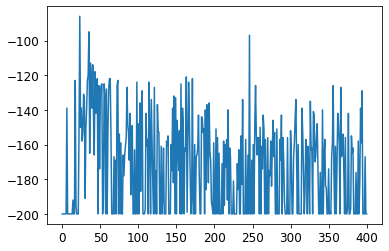

In [7]:
plt.plot(list(range(0,len(all_rewards))), all_rewards)

In [12]:
count = sum(map(lambda x : x!=-200, all_rewards))
print("A reusit sa ajunga la steag in: {:.2f}% din episoade".format(count/400*100))

A reusit sa ajunga la steag in: 62.25% din episoade
